In [1]:
import numpy as np
from PIL import Image
import glob

filelist_black = glob.glob('./color/black/*.jpg')
filelist_red = glob.glob('./color/red/*.jpg')

input_black = np.array([np.array(Image.open(fname)).flatten() for fname in filelist_black])
label_black = np.full((100,), 0)

input_red = np.array([np.array(Image.open(fname)).flatten() for fname in filelist_red])
label_red = np.full((100,), 1)

data = np.concatenate((input_black, input_red))
labels = np.concatenate((label_black, label_red))

In [2]:
temp = data[0]
temp.shape

(120000,)

In [3]:
img = Image.fromarray(temp)
display(img)

arr = temp.flatten()#reshape(120000)
print(arr.shape)

arr = arr.reshape((200,200,3))
print(arr.shape)
img = Image.fromarray(arr)

display(img)



IndexError: tuple index out of range

(200, 200, 3)
(120000,)
(200, 200, 3)


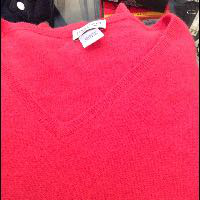

jed
(200, 200, 3)


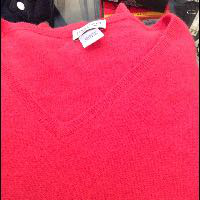

(200, 200, 3)


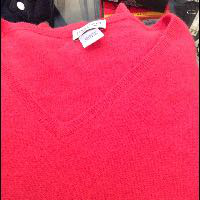

In [4]:
img = './color/red/7339329.jpg'
img = Image.open(fname)

arr = np.array(Image.open(fname))
print(arr.shape)

arr = arr.flatten()
print(arr.shape)

arr = arr.reshape(200,200,3)
print(arr.shape)

img = Image.fromarray(arr, 'RGB')
display(img)

temp = np.array(Image.open(fname))
print('jed')
print(temp.shape)
img3 = Image.fromarray(temp, 'RGB')
display(img3)

temparr = temp.reshape(200,200,3)
print(temparr.shape)

img = Image.fromarray(temparr, 'RGB')
display(img)


In [5]:
labels = labels.reshape(200,1)

In [6]:
labels.shape

(200, 1)

In [8]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Dropout

# model = Sequential([
#     Dense(32, input_shape=(40000,3)),
#     Activation('relu'),
#     Dense(10),
#     Activation('softmax'),
# ])

model = Sequential()
# model.add(Dense(64, input_dim=20, activation='relu'))
model.add(Dense(400, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(30, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
# model.add(Activation('relu'))

In [9]:
model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [10]:
data.shape

(200, 120000)

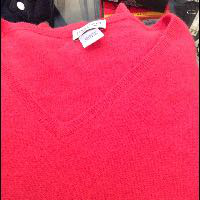

In [11]:
img = Image.fromarray(data[150].reshape((200,200,3)), 'RGB')
display(img)

In [12]:
labels.shape

(200, 1)

In [13]:
def unison_shuffled_copies(a, b):
    assert len(a) == len(b)
    p = np.random.permutation(len(a))
    return a[p], b[p]

In [41]:
data, labels = unison_shuffled_copies(data, labels)

In [14]:
history = model.fit(data, labels, epochs=10, batch_size=32)

Epoch 1/10
200/200 [==============================] - 6s 32ms/step - loss: 3.9630 - acc: 0.4650
Epoch 2/10
200/200 [==============================] - 4s 22ms/step - loss: 2.5423 - acc: 0.5150
Epoch 3/10
200/200 [==============================] - 4s 22ms/step - loss: 2.8784 - acc: 0.4950
Epoch 4/10
200/200 [==============================] - 5s 23ms/step - loss: 3.0673 - acc: 0.5000
Epoch 5/10
200/200 [==============================] - 5s 23ms/step - loss: 3.6225 - acc: 0.5200
Epoch 6/10
200/200 [==============================] - 4s 22ms/step - loss: 3.4875 - acc: 0.4800
Epoch 7/10
200/200 [==============================] - 5s 23ms/step - loss: 3.1903 - acc: 0.4850
Epoch 8/10
200/200 [==============================] - 5s 23ms/step - loss: 2.5656 - acc: 0.5100
Epoch 9/10
200/200 [==============================] - 5s 23ms/step - loss: 3.6613 - acc: 0.4950
Epoch 10/10
200/200 [==============================] - 5s 23ms/step - loss: 3.3289 - acc: 0.4900


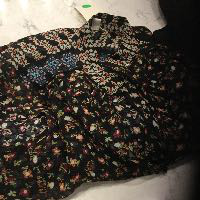

[0]


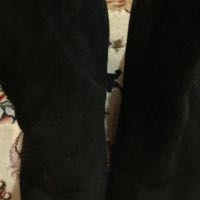

[0]


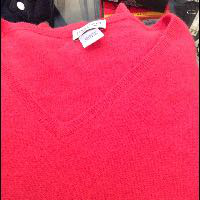

[1]


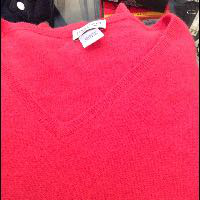

[1]


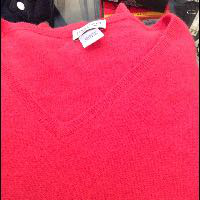

[1]


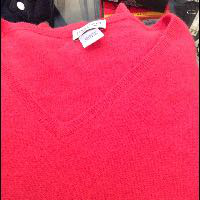

[1]


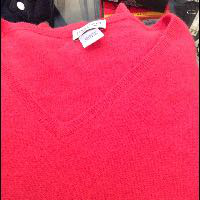

[1]


In [15]:
indexes = [1,5,100,150,164,199,175]

for i in indexes:
    img = Image.fromarray(data[i].reshape((200,200,3)))
    display(img)
    print(labels[i])

In [17]:
from keras.optimizers import SGD
from keras.layers import Dense, Dropout, Activation
model = Sequential()
# Dense(64) is a fully-connected layer with 64 hidden units.
# in the first layer, you must specify the expected input data shape:
# here, 20-dimensional vectors.
model.add(Dense(64, activation='relu', input_dim=120000))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='binary_crossentropy',
              optimizer=sgd,
              metrics=['accuracy'])

history = model.fit(data, labels,
          epochs=200,
          batch_size=128)

Epoch 1/200
200/200 [==============================] - 1s 4ms/step - loss: 7.2106 - acc: 0.5450
Epoch 2/200
200/200 [==============================] - 0s 1ms/step - loss: 7.8173 - acc: 0.5150
Epoch 3/200
200/200 [==============================] - 0s 1ms/step - loss: 7.9785 - acc: 0.5050
Epoch 4/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 5/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 6/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 7/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 8/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 9/200
200/200 [==============================] - 0s 2ms/step - loss: 8.0590 - acc: 0.5000
Epoch 10/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 11/200
200/200 [=================

200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 86/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 87/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 88/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 89/200
200/200 [==============================] - 0s 996us/step - loss: 8.0590 - acc: 0.5000
Epoch 90/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 91/200
200/200 [==============================] - 0s 972us/step - loss: 8.0590 - acc: 0.5000
Epoch 92/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 93/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 94/200
200/200 [==============================] - 0s 974us/step - loss: 8.0590 - acc: 0.5000
Epoch 95/200
200/200 [===============

200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 169/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 170/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 171/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 172/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 173/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 174/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 175/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 176/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 177/200
200/200 [==============================] - 0s 1ms/step - loss: 8.0590 - acc: 0.5000
Epoch 178/200
200/200 [===========

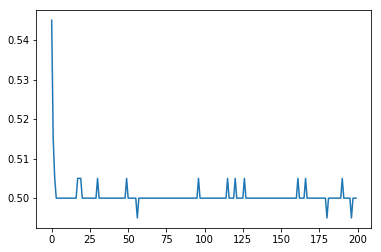

None

In [19]:
from matplotlib import pyplot
pyplot.plot(history.history['acc'])
display(pyplot.show())

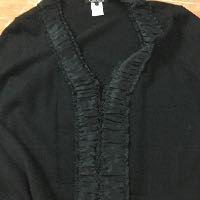

0


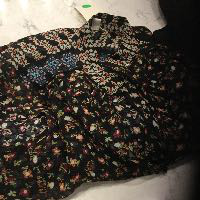

0


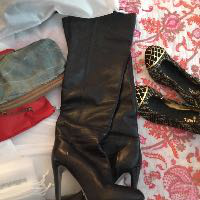

0


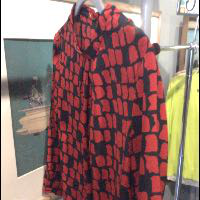

0


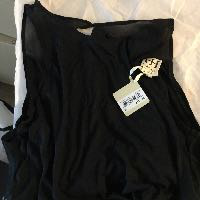

0


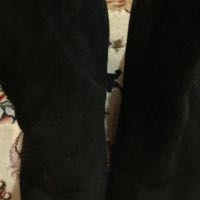

0


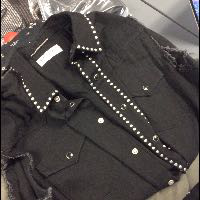

0


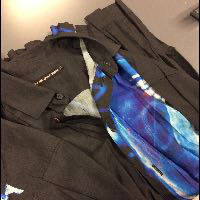

0


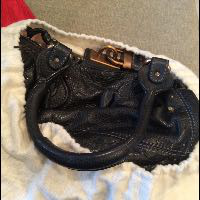

0


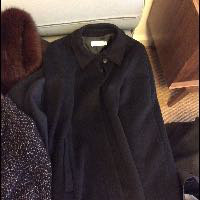

0


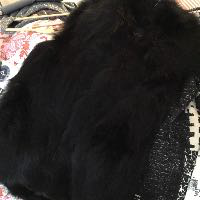

0


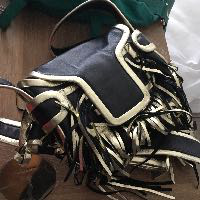

0


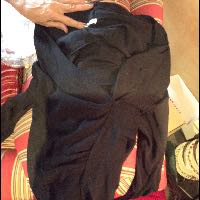

0


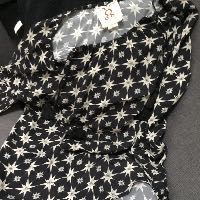

0


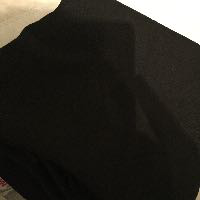

0


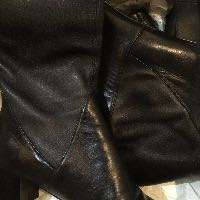

0


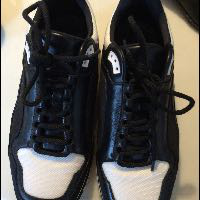

0


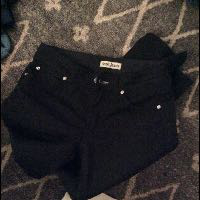

0


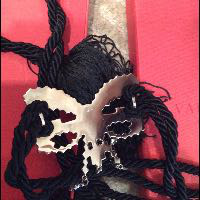

0


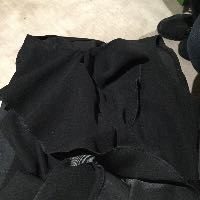

0


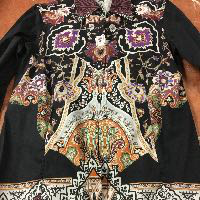

0


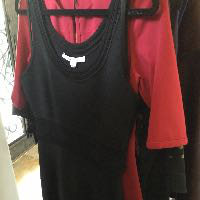

0


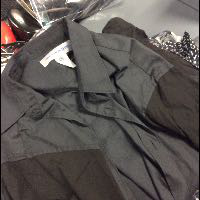

0


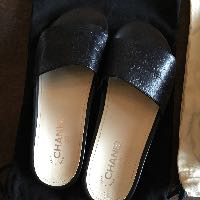

0


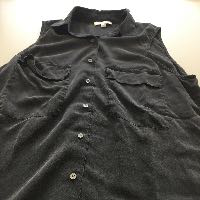

0


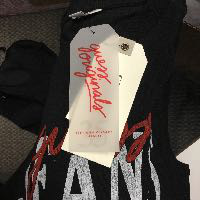

0


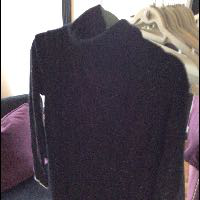

0


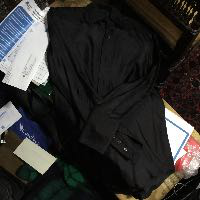

0


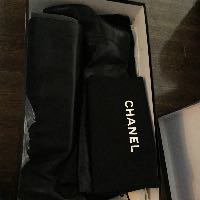

0


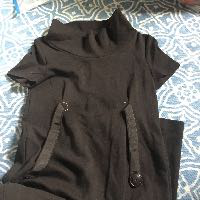

0


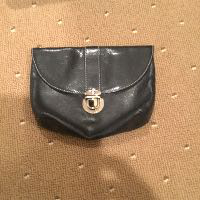

0


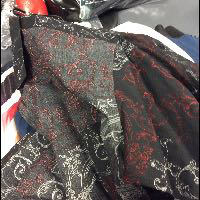

0


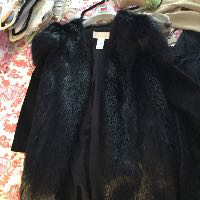

0


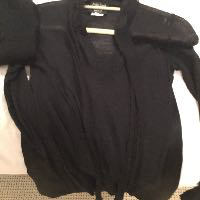

0


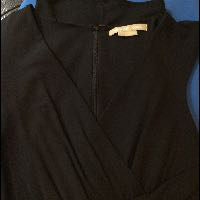

0


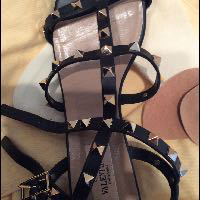

0


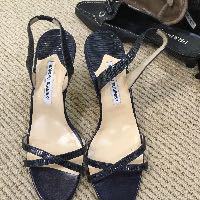

0


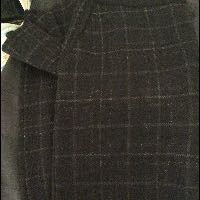

0


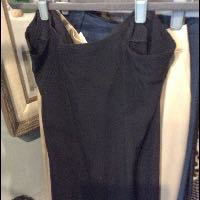

0


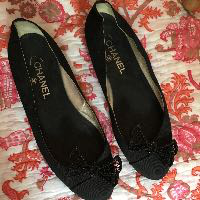

0


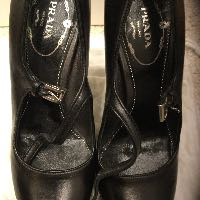

0


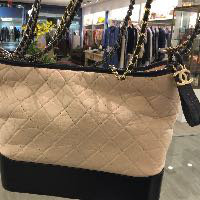

0


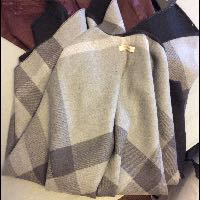

0


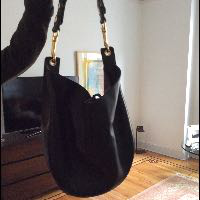

0


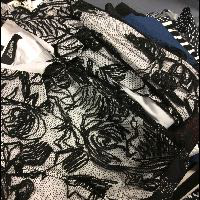

0


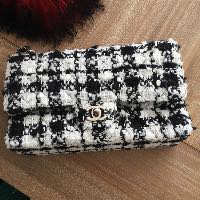

0


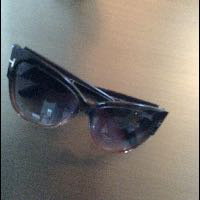

0


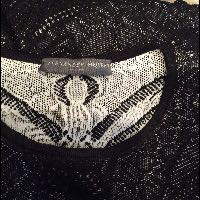

0


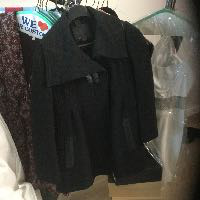

0


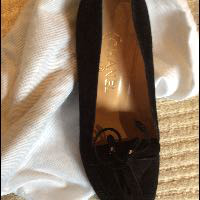

0


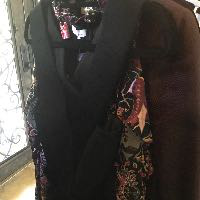

0


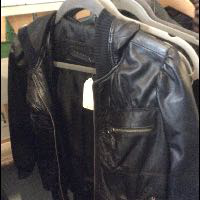

0


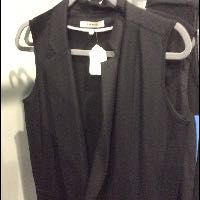

0


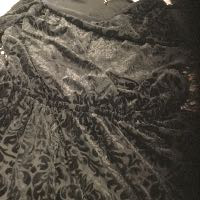

0


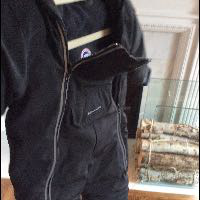

0


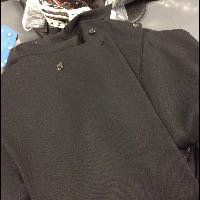

0


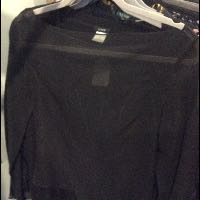

0


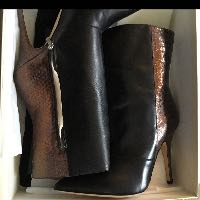

0


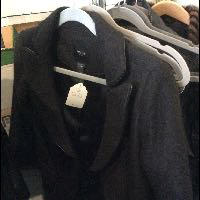

0


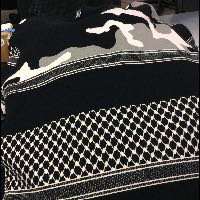

0


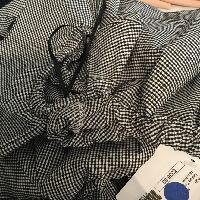

0


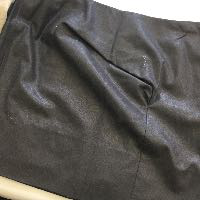

0


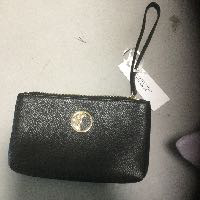

0


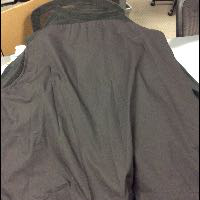

0


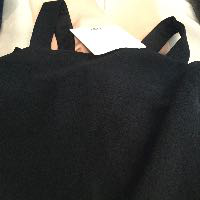

0


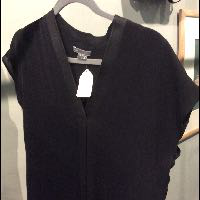

0


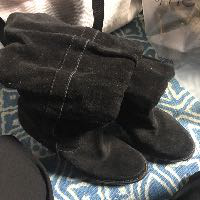

0


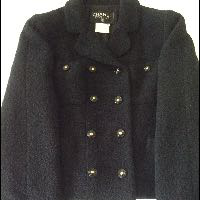

0


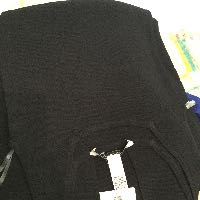

0


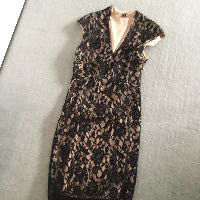

0


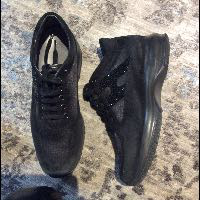

0


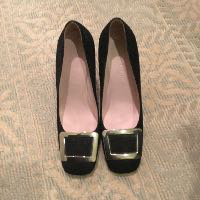

0


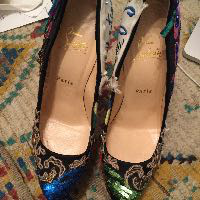

0


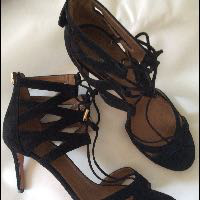

0


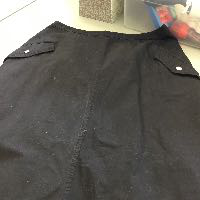

0


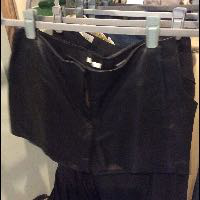

0


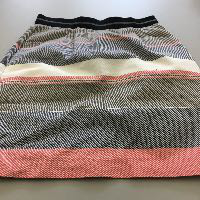

0


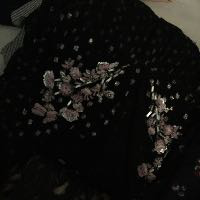

0


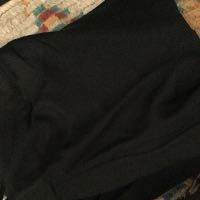

0


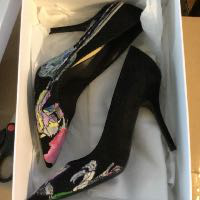

0


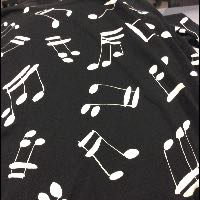

0


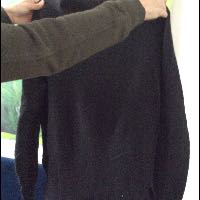

0


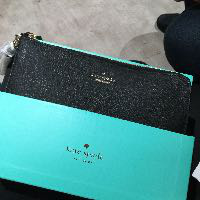

0


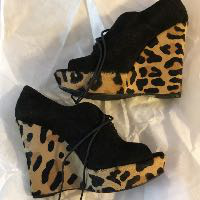

0


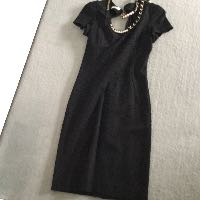

0


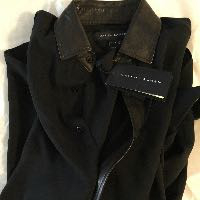

0


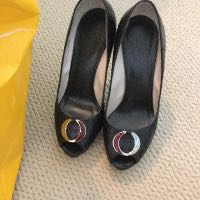

0


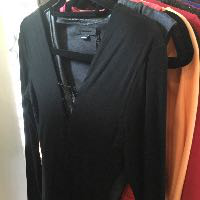

0


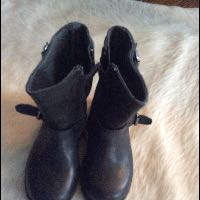

0


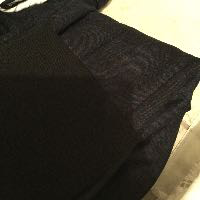

0


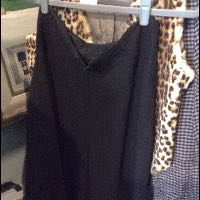

0


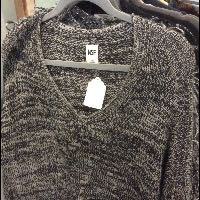

0


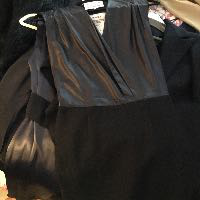

0


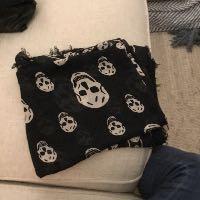

0


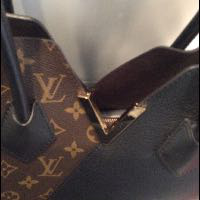

0


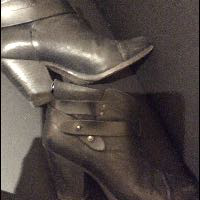

0


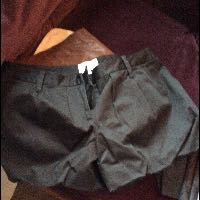

0


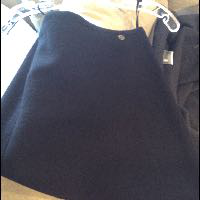

0


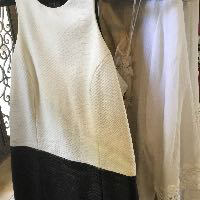

0


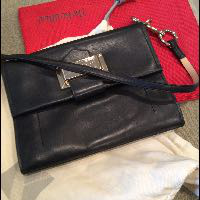

0


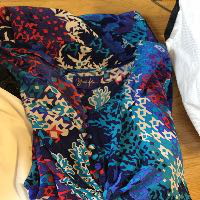

1


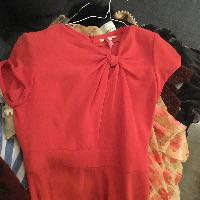

1


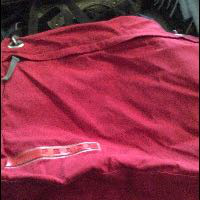

1


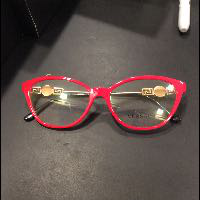

1


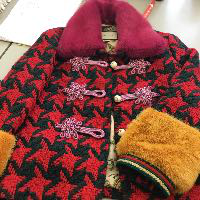

1


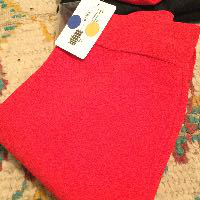

1


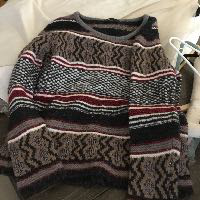

1


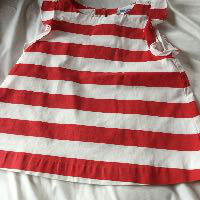

1


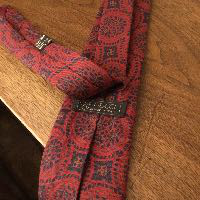

1


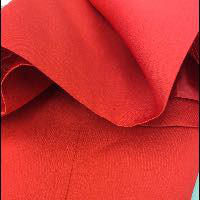

1


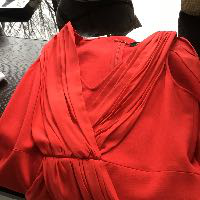

1


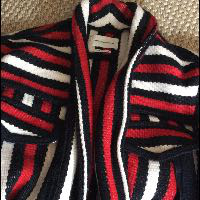

1


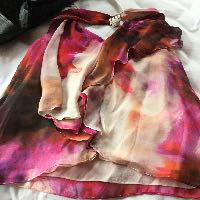

1


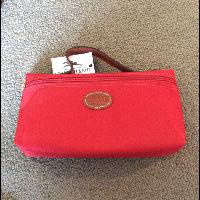

1


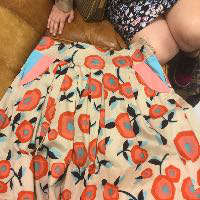

1


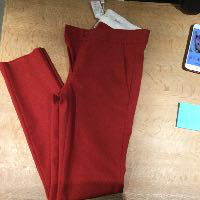

1


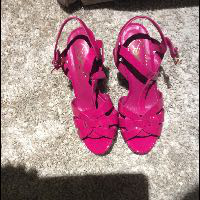

1


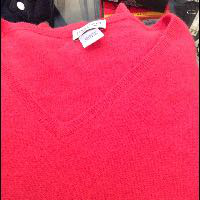

1


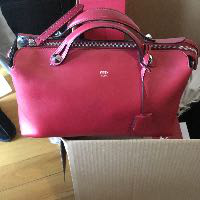

1


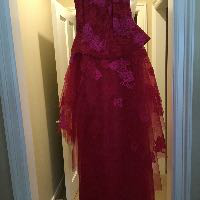

1


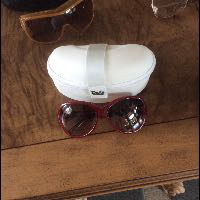

1


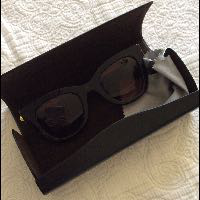

1


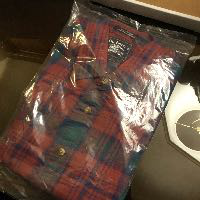

1


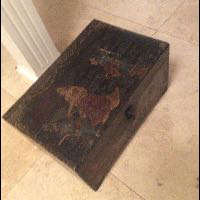

1


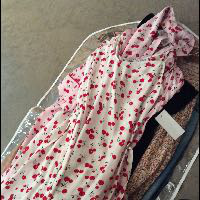

1


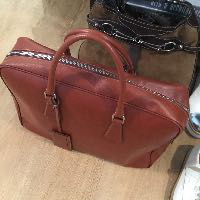

1


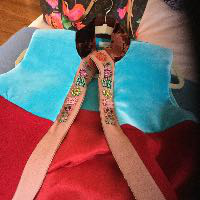

1


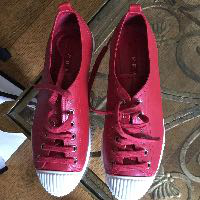

1


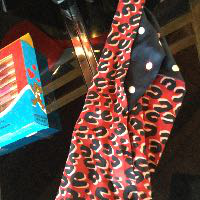

1


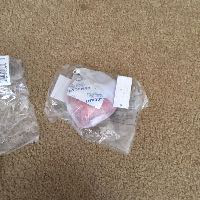

1


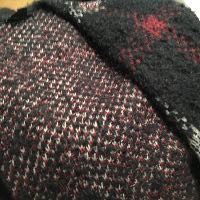

1


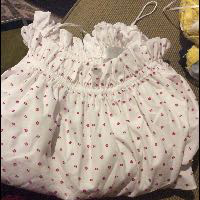

1


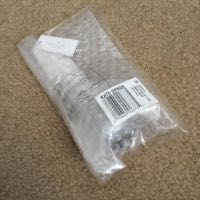

1


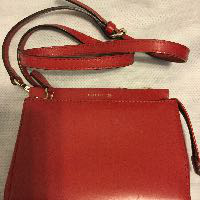

1


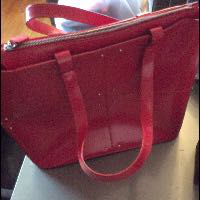

1


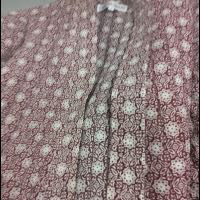

1


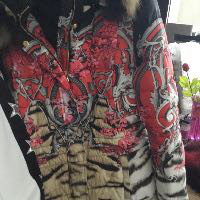

1


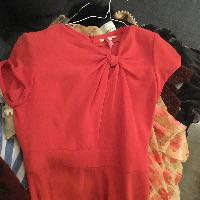

1


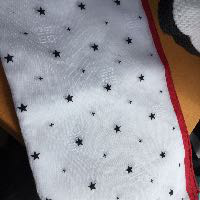

1


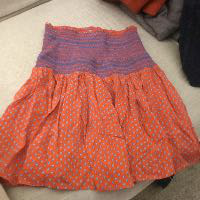

1


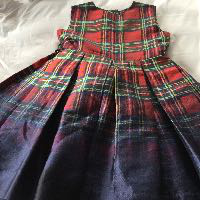

1


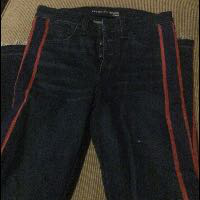

1


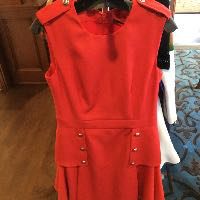

1


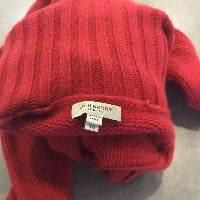

1


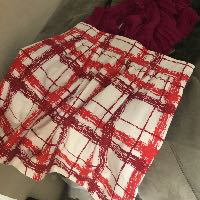

1


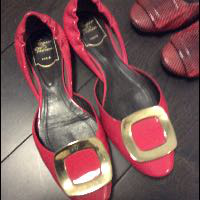

1


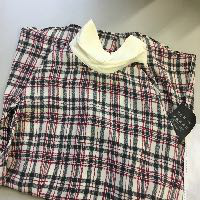

1


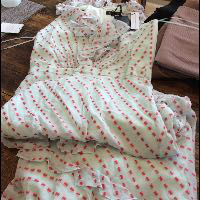

1


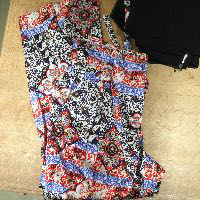

1


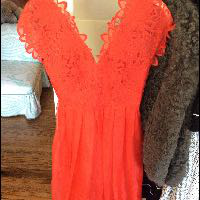

1


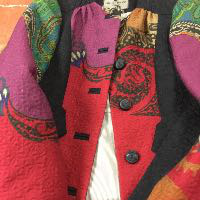

1


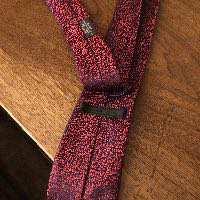

1


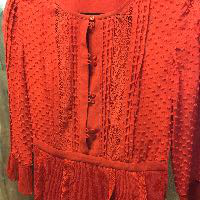

1


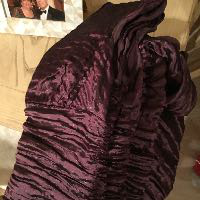

1


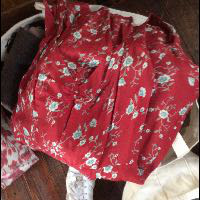

1


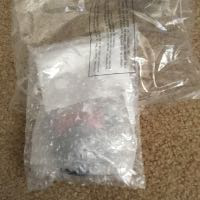

1


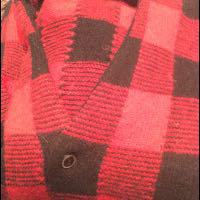

1


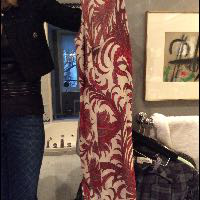

1


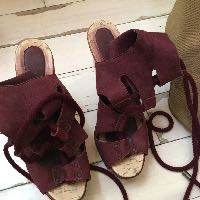

1


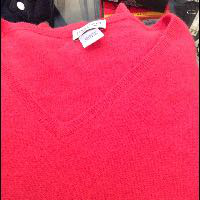

1


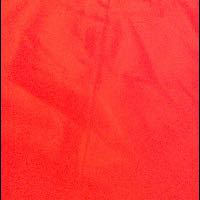

1


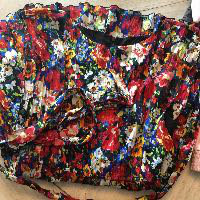

1


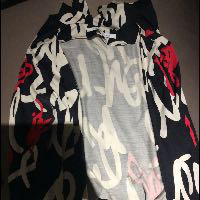

1


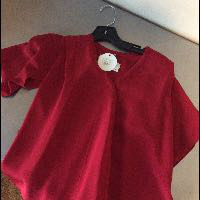

1


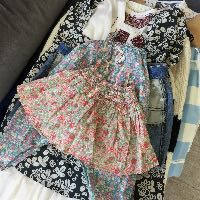

1


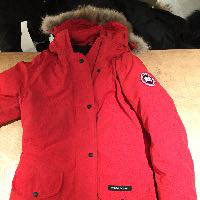

1


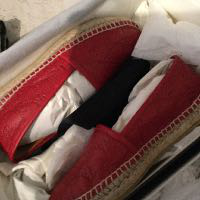

1


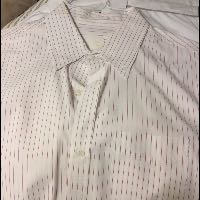

1


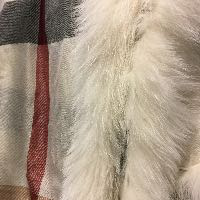

1


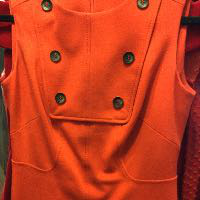

1


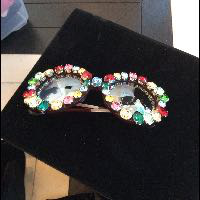

1


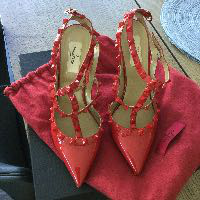

1


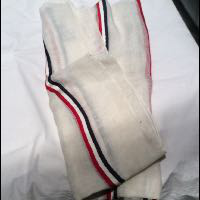

1


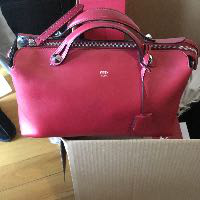

1


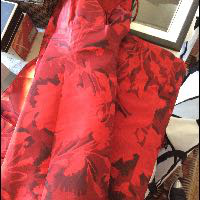

1


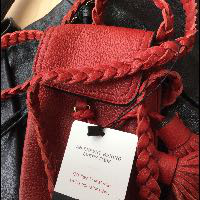

1


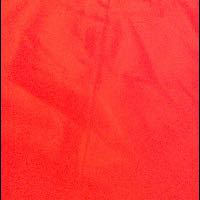

1


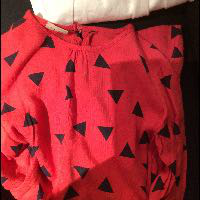

1


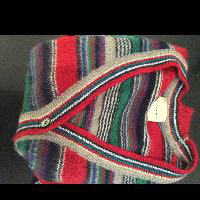

1


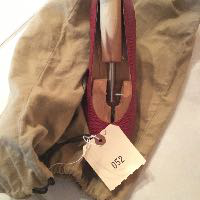

1


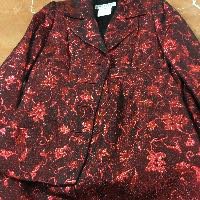

1


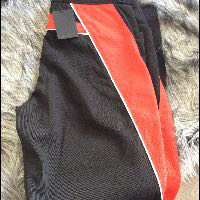

1


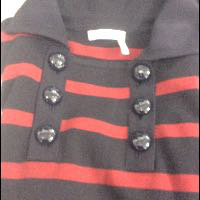

1


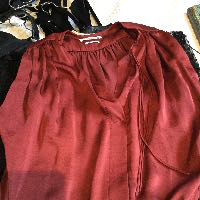

1


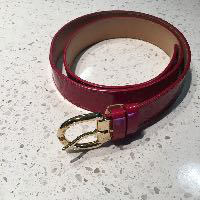

1


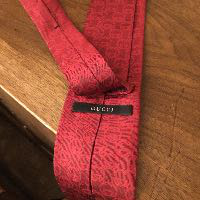

1


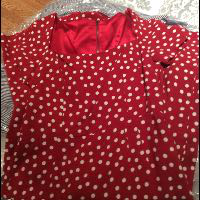

1


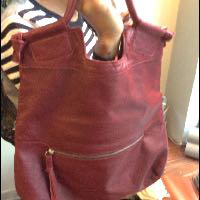

1


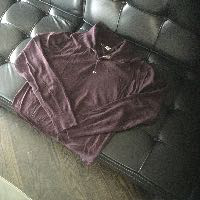

1


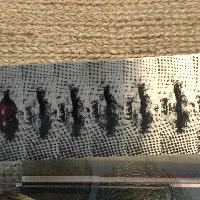

1


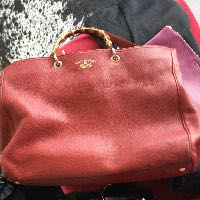

1


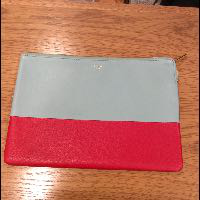

1


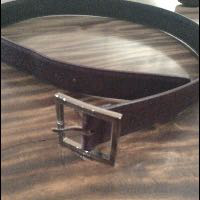

1


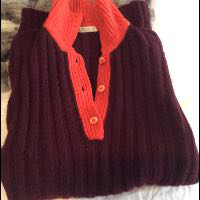

1


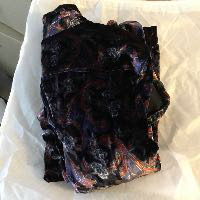

1


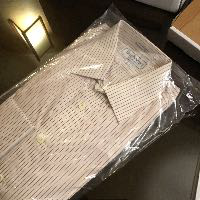

1


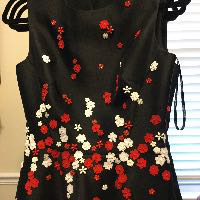

1


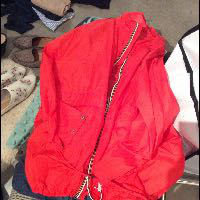

1


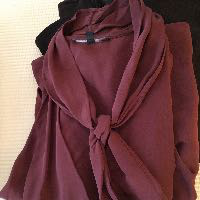

1


In [54]:
for i in range(0,199):
    img = Image.fromarray(data[i].reshape((200,200,3)))
    display(img)
    print(labels[i])